# Load required libraries
Also setting some global settings

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import os

import scanpy as sc
import anndata as ad
import celltypist
from celltypist import models
from matplotlib import pyplot as plt
from scipy.stats import median_abs_deviation
from scipy.sparse import issparse, csr_matrix

import urllib.request
from pathlib import Path

sc.settings.verbosity = 1 # errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80)

We are going to supress warnings because the warnings issued in this tutorial can safely be ignored. If using this in your own code, be sure to run without warnings suppressed first and ensure that they can safely be ignored.

In [2]:
import warnings

warnings.simplefilter(action='ignore', category=Warning)

# Read in count data 
Load the count data into anndata objects and then concatenate them into a single anndata object.

In [3]:
sample_ids = ["PBMMC_1", "PBMMC_2", "PBMMC_3", "ETV6-RUNX1_1", "ETV6-RUNX1_2", 
              "ETV6-RUNX1_3", "PRE-T_1", "PRE-T_2"]
adata_list = []
for i in sample_ids:
    mtx_dir = f"../results/04_star_ensembl/{i}.Solo.out/Gene/filtered/"
    adata = sc.read_10x_mtx(path=mtx_dir, cache=True)
    adata_list.append(adata)
adata = ad.concat(adata_list, label="sample", keys=sample_ids)
adata.obs_names_make_unique()
del(adata_list)

Look at what the count data look like.

In [4]:
adata.X.todense()

matrix([[ 0.,  0.,  0., ...,  2.,  0.,  0.],
        [ 0.,  0.,  0., ...,  2.,  0.,  0.],
        [ 0.,  0.,  0., ..., 20.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ...,  7.,  0.,  0.],
        [ 0.,  0.,  0., ..., 12.,  0.,  0.],
        [ 0.,  0.,  0., ..., 22.,  0.,  0.]], dtype=float32)

# 1. Quality Control

### Cells per sample

In [5]:
print(adata.obs["sample"].value_counts())

sample
ETV6-RUNX1_2    6293
ETV6-RUNX1_3    4015
PBMMC_2         3148
PRE-T_1         2979
PRE-T_2         2900
ETV6-RUNX1_1    2794
PBMMC_3         2482
PBMMC_1          677
Name: count, dtype: int64


In [6]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")
adata.var

,mt,ribo,hb
PRDM16,False,False,False
ENSG00000284616,False,False,False
PEX10,False,False,False
ENSG00000260972,False,False,False
RPL21P21,False,True,False
...,...,...,...
MT-ND6,True,False,False
MT-TE,True,False,False
MT-CYB,True,False,False
MT-TT,True,False,False


In [7]:
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, 
                           percent_top=[20], log1p=True)

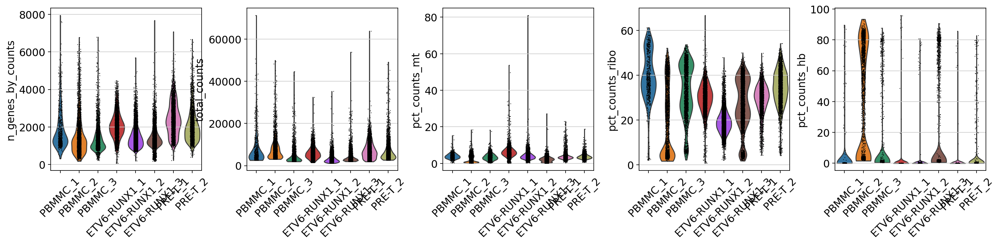

In [8]:
sc.pl.violin(adata, ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo", "pct_counts_hb"],
             groupby="sample", rotation=45)

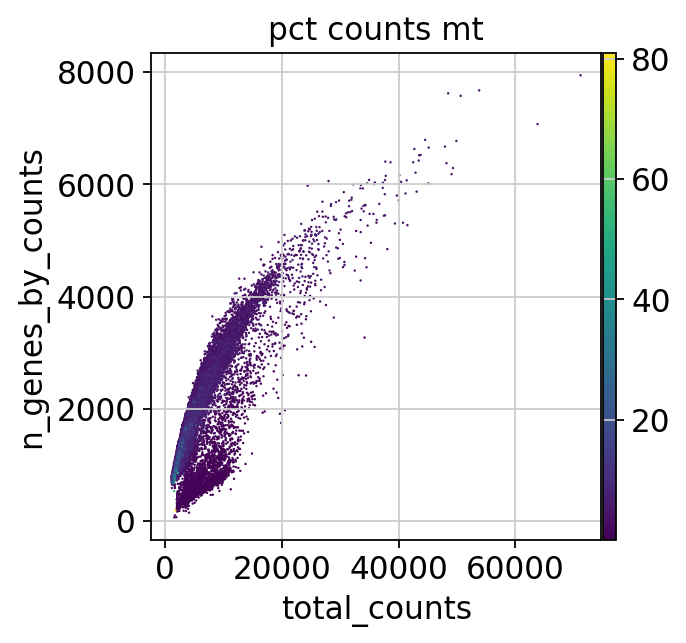

In [9]:
p4 = sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", 
                   color="pct_counts_mt")

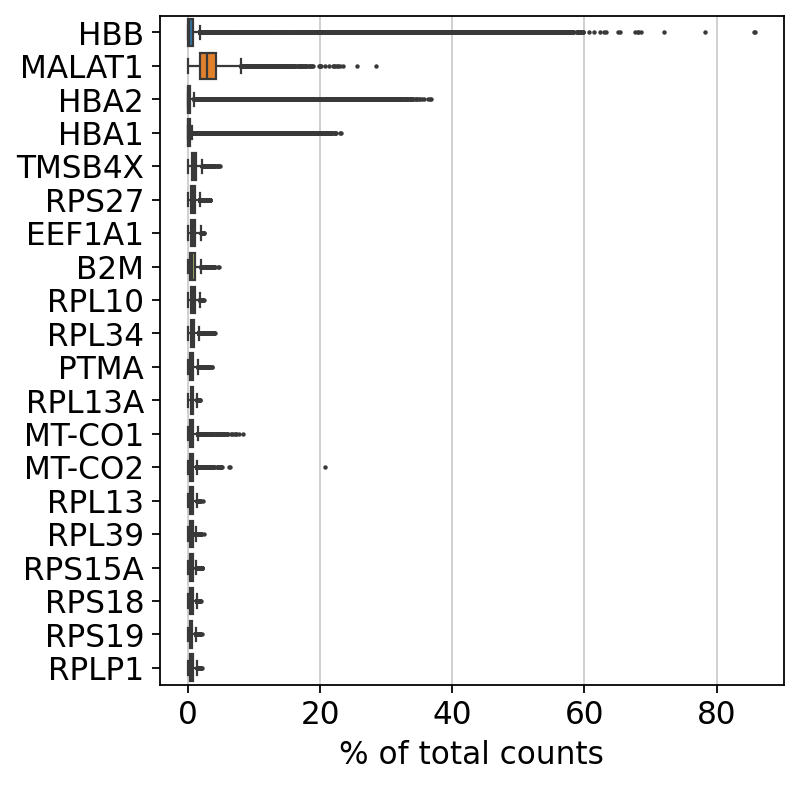

In [10]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [11]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M )
    return outlier

### Identify outliers by counts of cells and genes

In [12]:
for i in sample_ids:
    sample_mask = adata.obs["sample"] == i
    sample_adata = adata[sample_mask]
    outliers = (is_outlier(sample_adata, "log1p_total_counts", 3)
              | is_outlier(sample_adata, "log1p_n_genes_by_counts", 3)
              | is_outlier(sample_adata, "pct_counts_in_top_20_genes", 4))
    adata.obs.loc[sample_mask, "outlier"] = outliers
adata.obs["outlier"] = adata.obs["outlier"].astype(bool) # Needed due to https://github.com/pandas-dev/pandas/issues/55509
adata.obs["outlier"].value_counts()

outlier
False    22385
True      2903
Name: count, dtype: int64

### Identify outliers by counts of mitochondrial genes

In [13]:
for i in sample_ids:
    sample_mask = adata.obs["sample"] == i
    sample_adata = adata[sample_mask]
    outliers = (is_outlier(sample_adata, "pct_counts_mt", 3)  
                        | (sample_adata.obs["pct_counts_mt"] > 8))
    adata.obs.loc[sample_mask, "mt_outlier"] = outliers
adata.obs["mt_outlier"] = adata.obs["mt_outlier"].astype(bool) # Needed due to https://github.com/pandas-dev/pandas/issues/55509
adata.obs["mt_outlier"].value_counts()

mt_outlier
False    22853
True      2435
Name: count, dtype: int64

### Filter Outlier Cells

In [14]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(adata.obs["outlier"] == False) & (adata.obs["mt_outlier"] == False)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 25288
Number of cells after filtering of low quality cells: 20479


### Filter low count genes and cells with low gene counts
Filter any genes occurring in fewer than 20 cells.

In [15]:
print(f"Total number of genes: {adata.n_vars}")
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=80)
print(f"Number of genes after cell filter: {adata.n_vars}")

Total number of genes: 78686
Number of genes after cell filter: 17658


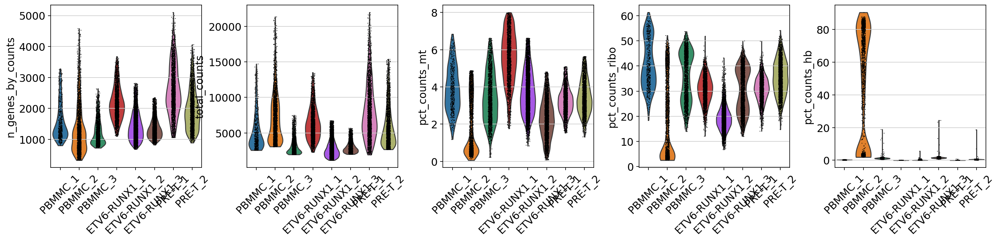

In [16]:
sc.pl.violin(adata, ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo", "pct_counts_hb"],
             groupby="sample", rotation=45)

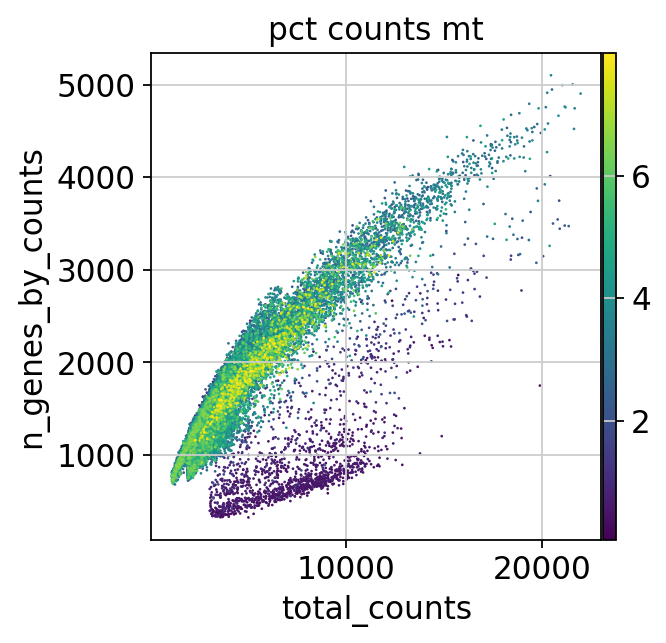

In [17]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

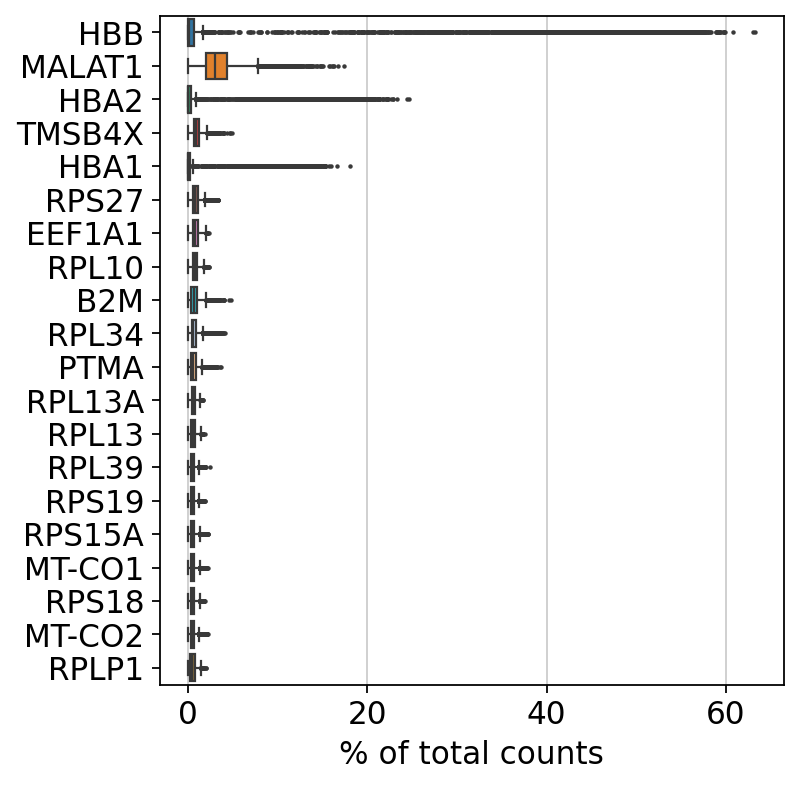

In [18]:
sc.pl.highest_expr_genes(adata, n_top=20)

### Doublet detection


In [19]:
sc.pp.scrublet(adata, batch_key="sample")

In [20]:
adata.obs["predicted_doublet"].value_counts()

predicted_doublet
False    20413
True        66
Name: count, dtype: int64

We could wait to remove these after visualizing the distribution of cells marked as doublets.

In [21]:
adata = adata[~adata.obs["predicted_doublet"]].copy()

# 2. Normalization

<Axes: xlabel='total_counts', ylabel='Count'>

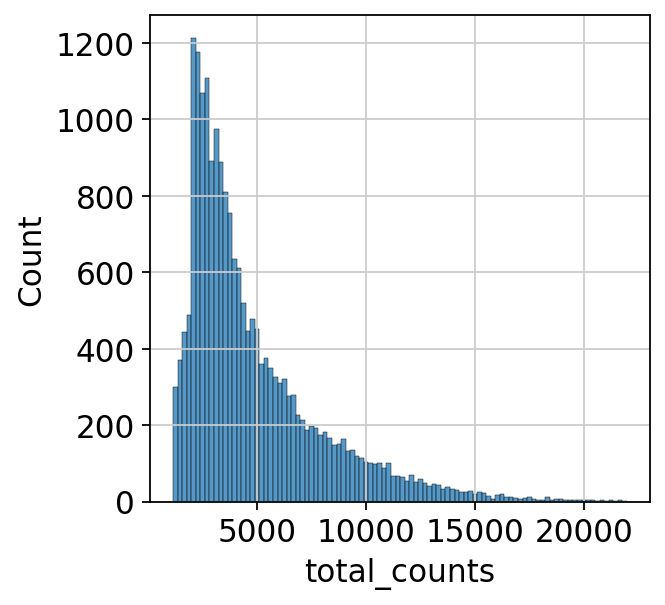

In [22]:
sns.histplot(adata.obs["total_counts"], bins=100)

Make a copy of data to use later

In [23]:
adata.layers["counts"] = adata.X.copy()

### Shifted logarithm

In [24]:
scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

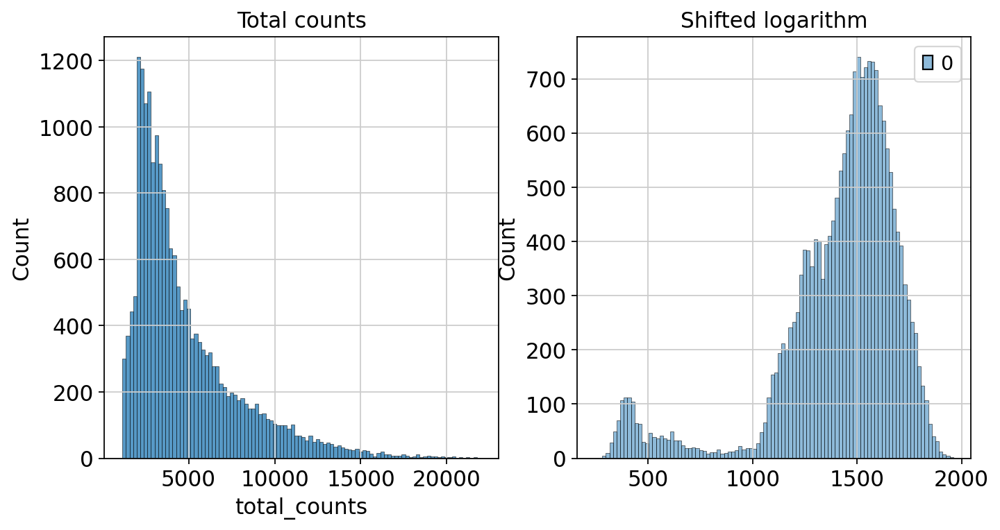

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(adata.layers["log1p_norm"].sum(1), bins=100, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()


In [ ]:
from scipy.sparse import csr_matrix

In [ ]:
%%R
library(scran)
library(BiocParallel)

In [ ]:
# Preliminary clustering for differentiated normalisation
adata_pp = adata.copy()
sc.pp.normalize_total(adata_pp)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added="groups")

In [ ]:
data_mat = adata_pp.X.T
# convert to CSC if possible. See https://github.com/MarioniLab/scran/issues/70
if issparse(data_mat):
    if data_mat.nnz > 2**31 - 1:
        data_mat = data_mat.tocoo()
    else:
        data_mat = data_mat.tocsc()
ro.globalenv["data_mat"] = data_mat
ro.globalenv["input_groups"] = adata_pp.obs["groups"]

In [ ]:
del adata_pp

In [ ]:
%%R -o size_factors

size_factors = sizeFactors(
    computeSumFactors(
        SingleCellExperiment(
            list(counts=data_mat)), 
            clusters = input_groups,
            min.mean = 0.1,
            BPPARAM = MulticoreParam()
    )
)

In [ ]:
adata.obs["size_factors"] = size_factors
scran = adata.X / adata.obs["size_factors"].values[:, None]
adata.layers["scran_normalization"] = csr_matrix(sc.pp.log1p(scran))

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(
    adata.layers["scran_normalization"].sum(1), bins=100, kde=False, ax=axes[1]
)
axes[1].set_title("log1p with Scran estimated size factors")
plt.show()

# 3. Feature Selection

... storing 'sample' as categorical


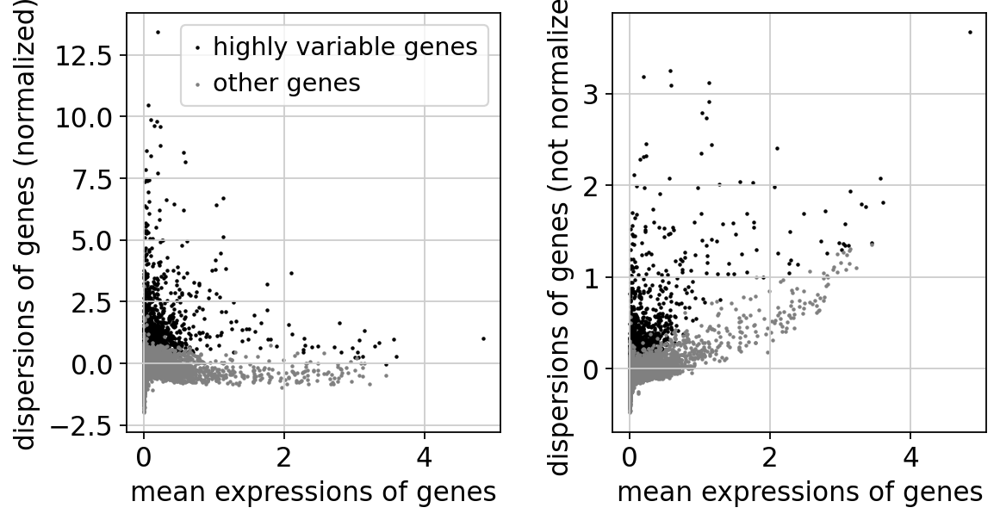

In [26]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="sample", 
                            layer="log1p_norm")
sc.pl.highly_variable_genes(adata)

In [27]:
adata.X = adata.layers["log1p_norm"]

# 4. Dimension Reduction

### PCA

In [28]:
sc.pp.pca(adata, svd_solver="arpack", mask_var="highly_variable")

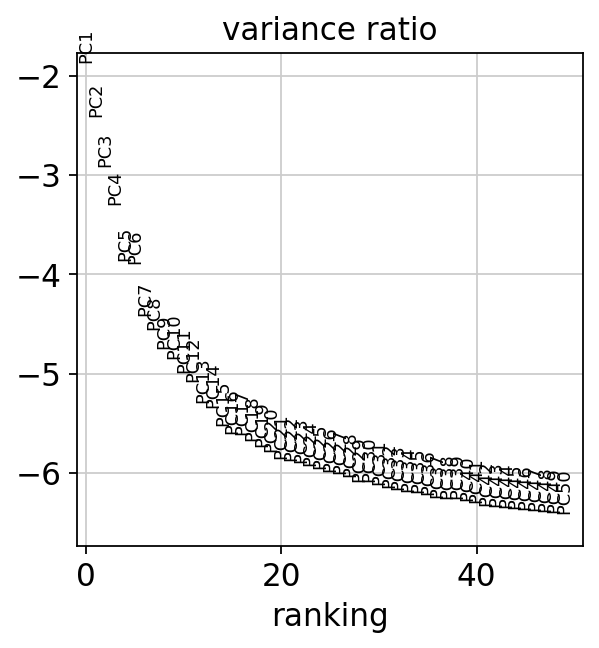

In [29]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

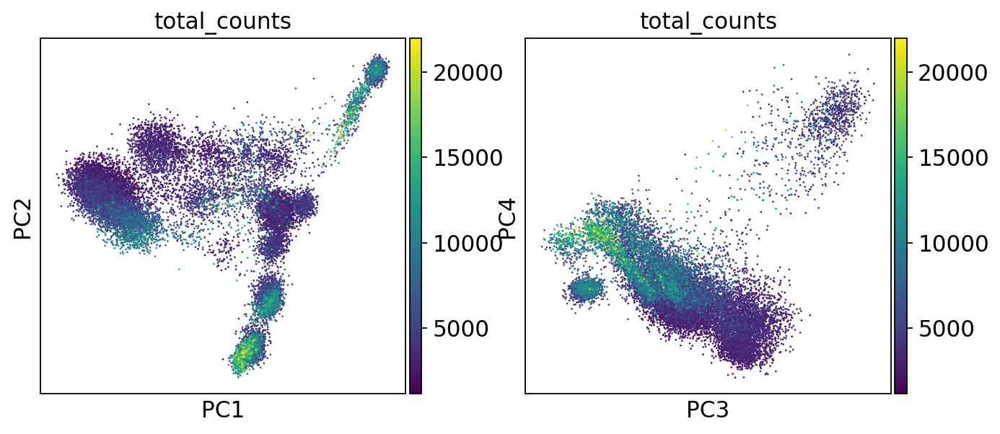

In [30]:
sc.pl.pca_scatter(adata, color="total_counts", components=["1,2", "3,4"])

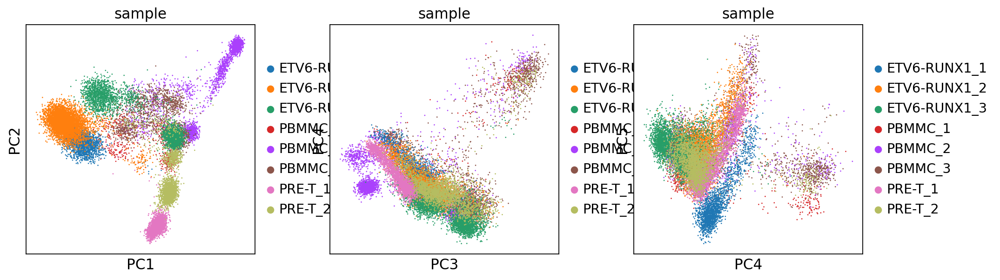

In [31]:
sc.pl.pca_scatter(adata, color="sample", components=["1,2", "3,4", "4,5"])

### tSNE
t-distributed stochastic neighborood embedding

use_rep: use indicate representation, if X_pca is not present, it is computed with defaults args.

In [32]:
# sc.tl.tsne(adata, use_rep="X_pca")

In [33]:
# sc.pl.tsne(adata, color="total_counts")

In [34]:
# sc.pl.tsne(adata, color="sample")

### UMAP

In [35]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

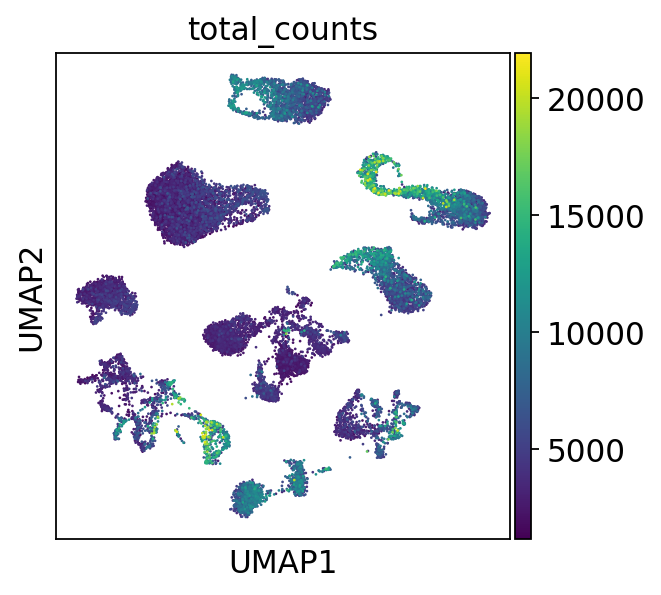

In [36]:
sc.pl.umap(adata, color="total_counts")

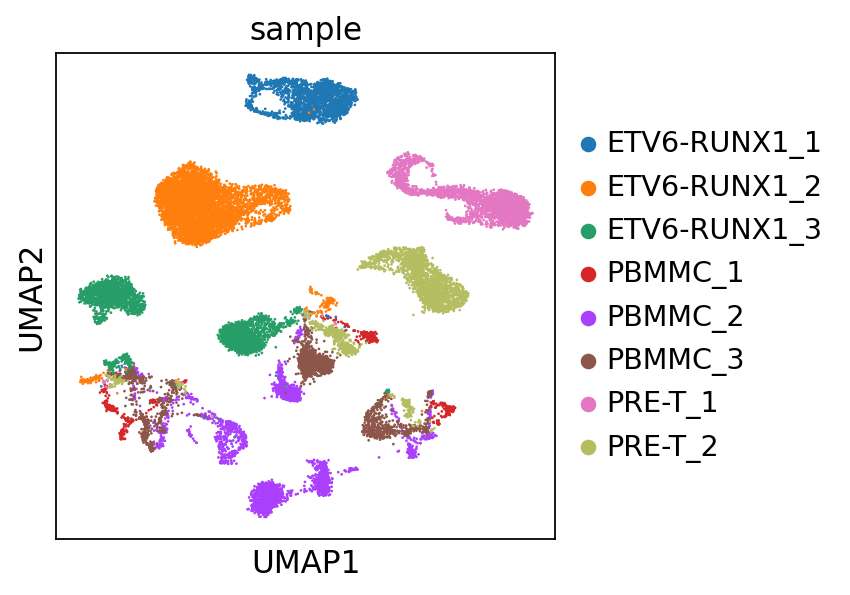

In [37]:
sc.pl.umap(adata, color="sample")

# 5. Integration

In [38]:
sc.external.pp.bbknn(adata, batch_key="sample")

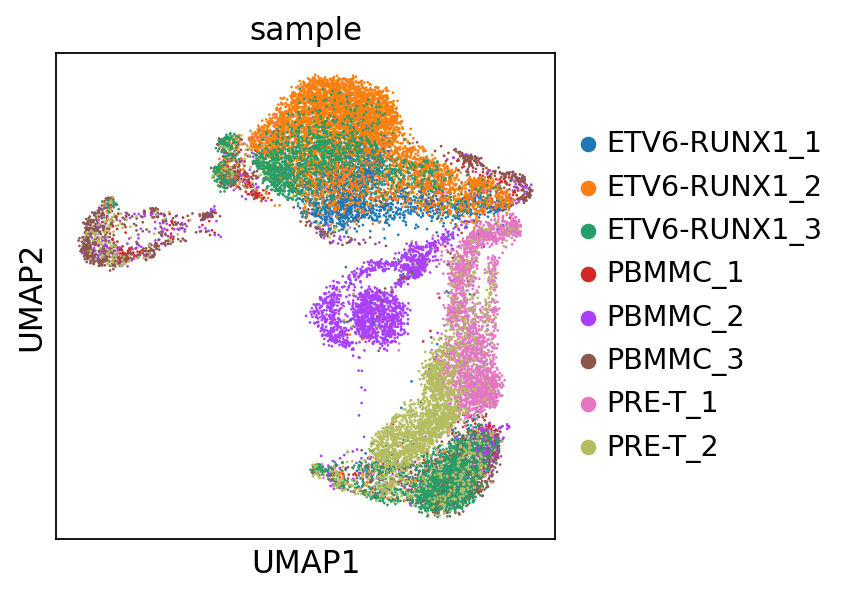

In [39]:
sc.tl.umap(adata)
sc.pl.umap(adata, color="sample")

# 6. Clustering

In [40]:
for res in [0.5, 1.0, 1.25]:
    sc.tl.leiden(adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph")

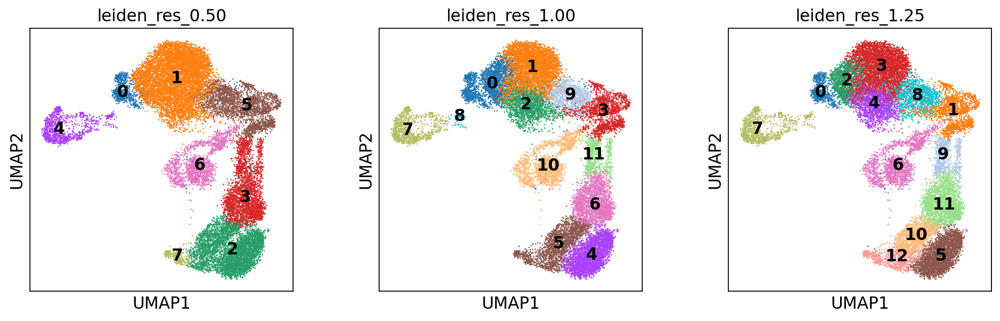

In [41]:
sc.pl.umap(
    adata,
    ncols=3,
    color=["leiden_res_0.50", "leiden_res_1.00", "leiden_res_1.25"],
    legend_loc="on data")

# 7. Annotation

## Manual Annotation

In [42]:
marker_genes = {
    "B cells": ["CD79A"],
    "CD20+ B cells": ["MS4A1"],
    "T cells": ["CD3D"]}


In [43]:
marker_genes_in_data = {}
for ct, markers in marker_genes.items():
    markers_found = []
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

B CELLS:


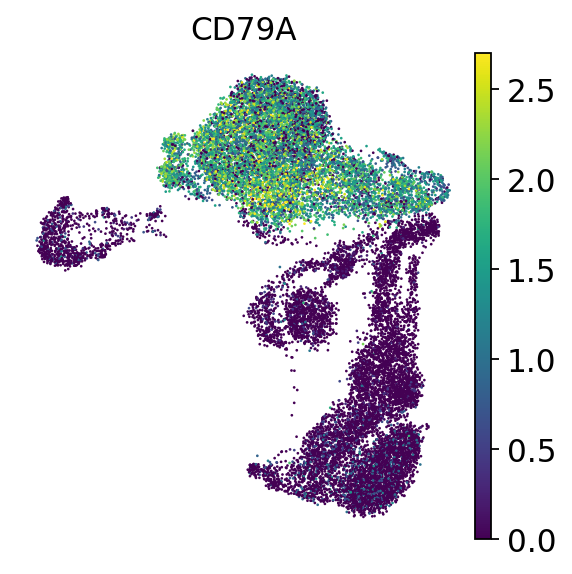

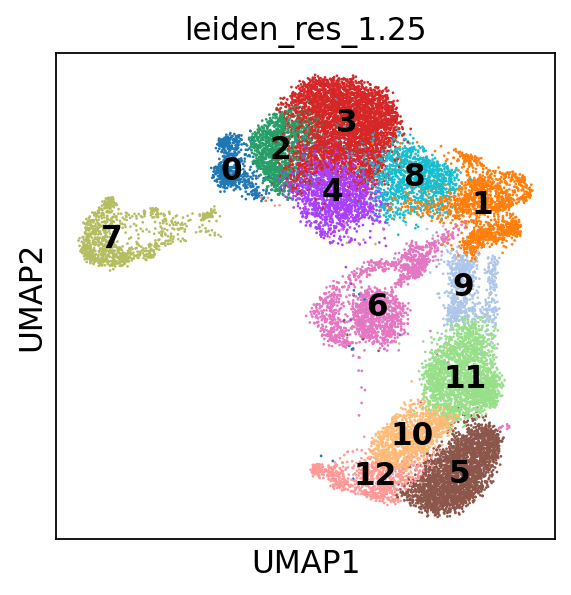





CD20+ B CELLS:


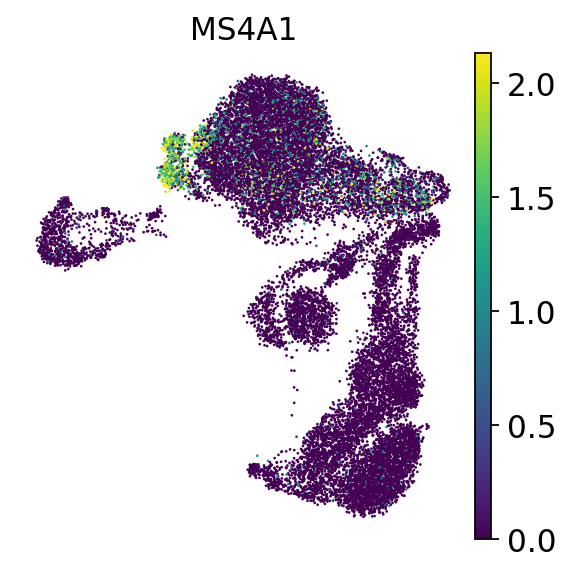

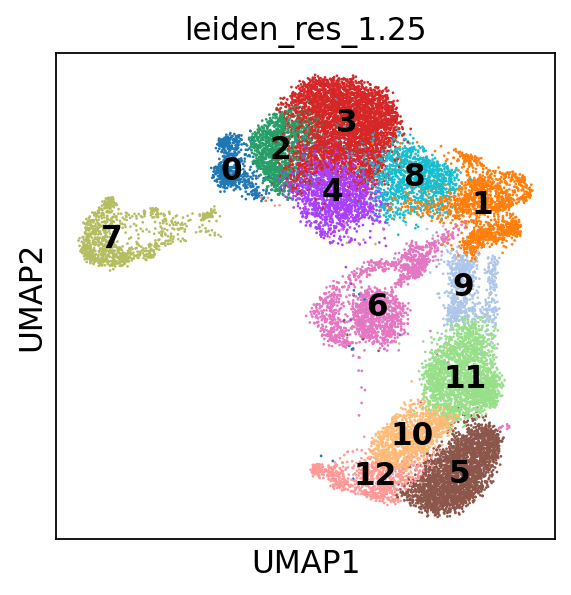





T CELLS:


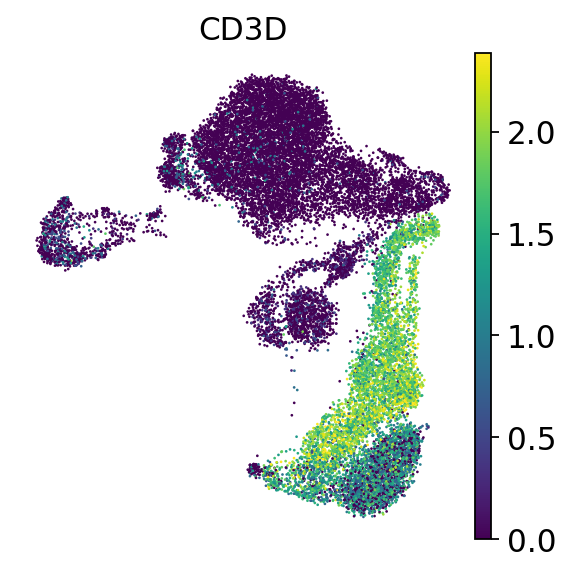

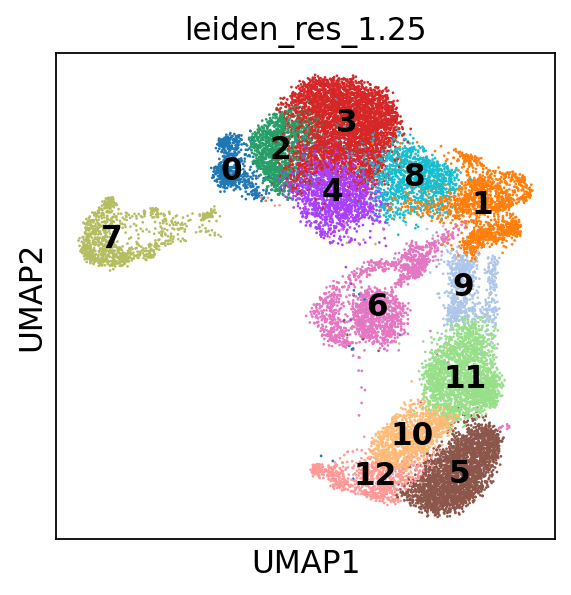

In [44]:
for ct in marker_genes.keys():
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
    )
    sc.pl.umap(adata, color="leiden_res_1.25", legend_loc="on data")
    print("\n\n\n")  # print white space for legibility

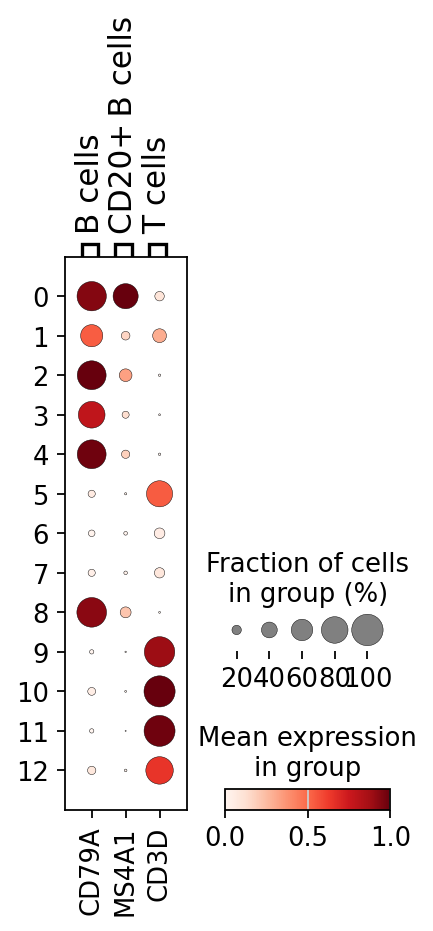

In [45]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_1.25", standard_scale="var")

In [46]:
annotation = {
    "0": "CD20+ B cells",
    "1": "B cells",
    "2": "B cells",
    "8": "B cells",
    "9": "B cells",
    "10": "B cells",
    "4": "T cells",
    "5": "T cells",
    "6": "T cells"}

In [47]:
adata.obs["manual_celltype_annotation"] = adata.obs["leiden_res_1.25"].map(annotation)

... storing 'manual_celltype_annotation' as categorical


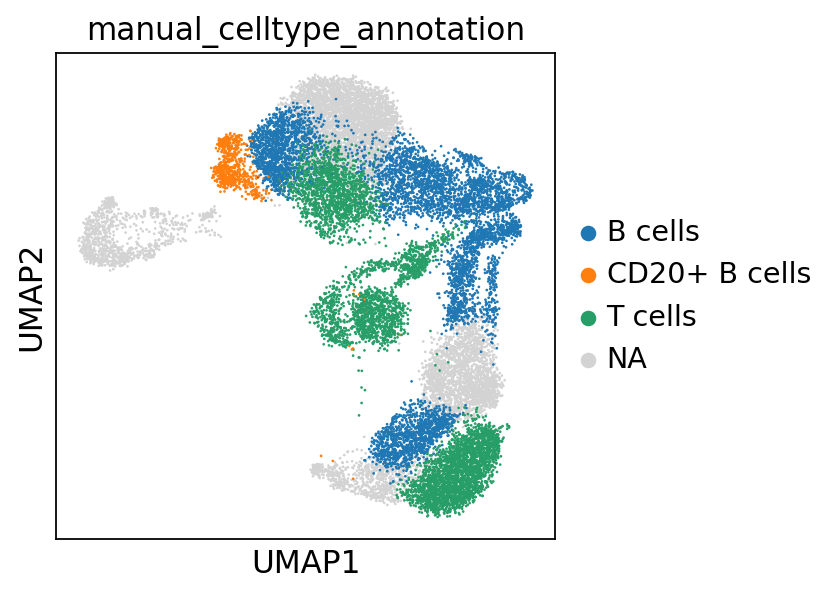

In [48]:
sc.pl.umap(adata, color=["manual_celltype_annotation"])

### Manual Annotation with differentially expressed genes

In [49]:
sc.tl.rank_genes_groups(adata, groupby="leiden_res_1.25", 
                        method="wilcoxon", key_added="dea_leiden_1.25")

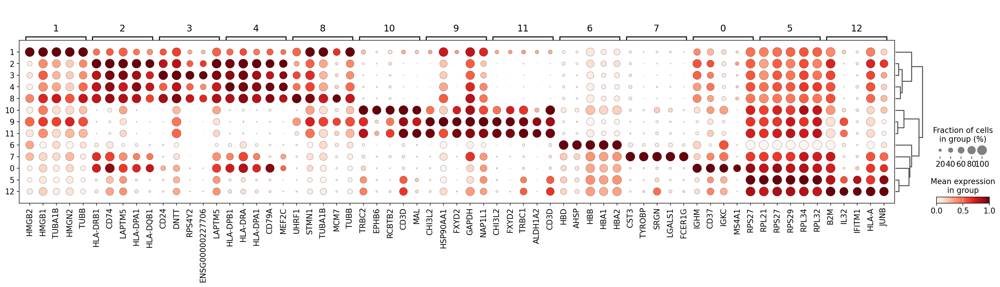

In [50]:
sc.pl.rank_genes_groups_dotplot(adata, groupby="leiden_res_1.25", 
                                standard_scale="var", n_genes=5, key="dea_leiden_1.25")

In [51]:
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_1.25",
    key_added="dea_leiden_1.25_filtered")

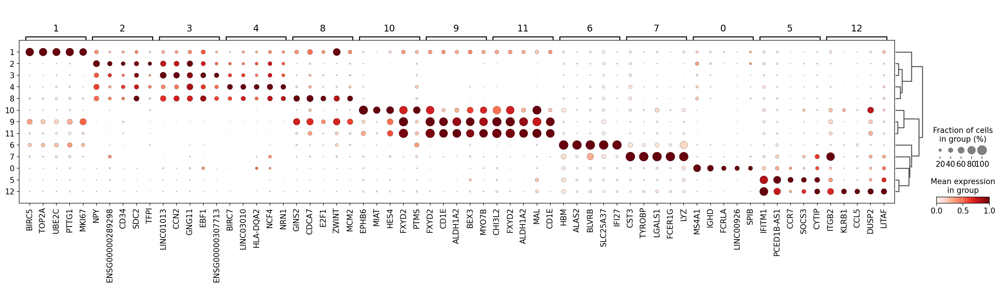

In [52]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_res_1.25",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_1.25_filtered")

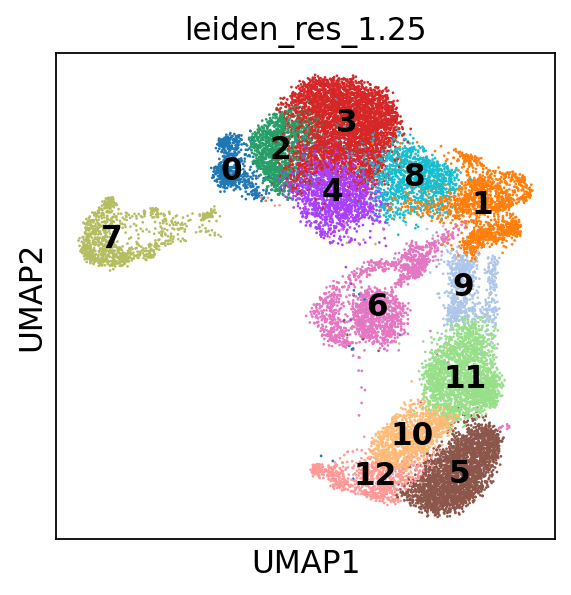

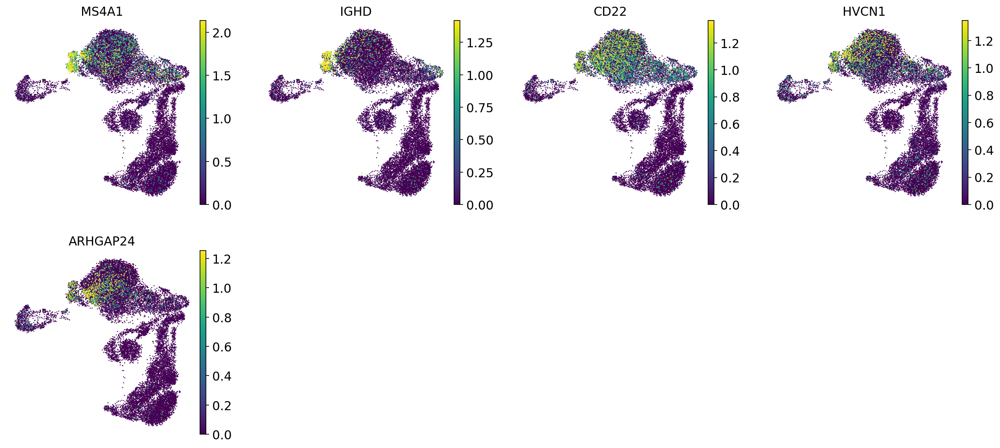

In [53]:
sc.pl.umap(adata, color="leiden_res_1.25", legend_loc="on data")
sc.pl.umap(
    adata,
    color=[
        "MS4A1",
        "IGHD",
        "CD22",
        "HVCN1",
        "ARHGAP24"],
    vmax="p99",
    legend_loc="on data",
    frameon=False)

### Automated Annotation

In [54]:
adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata_celltypist.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_total(adata_celltypist, target_sum=10**4)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

In [55]:
models.download_models(force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"])

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 54
📂 Storing models in /home/FCAM/kcobb/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


In [56]:
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

In [57]:
model_high.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [58]:
model_low.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [59]:
predictions_high = celltypist.annotate(adata_celltypist, model=model_high, majority_voting=True)

🔬 Input data has 20413 cells and 17658 genes
🔗 Matching reference genes in the model
🧬 4622 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


In [60]:
predictions_high_adata = predictions_high.to_adata()

In [61]:
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

In [62]:
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

🔬 Input data has 20413 cells and 17658 genes
🔗 Matching reference genes in the model
🧬 4622 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


In [63]:
predictions_low_adata = predictions_low.to_adata()

In [64]:
adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

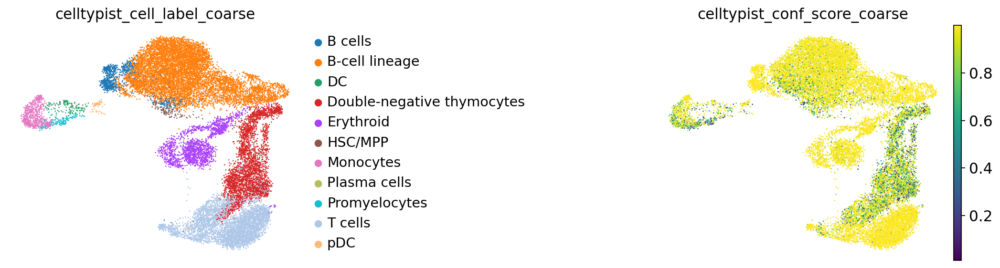

In [65]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

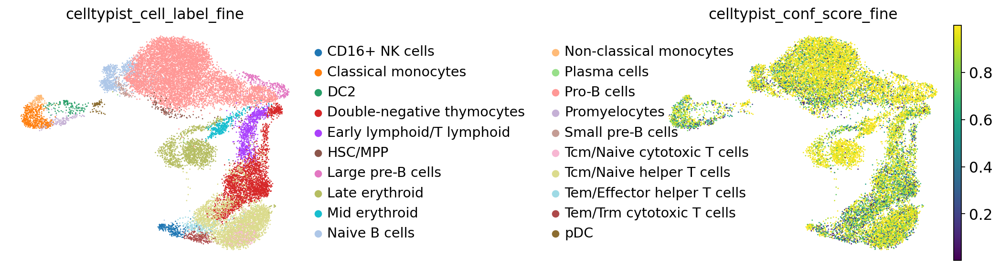

In [66]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

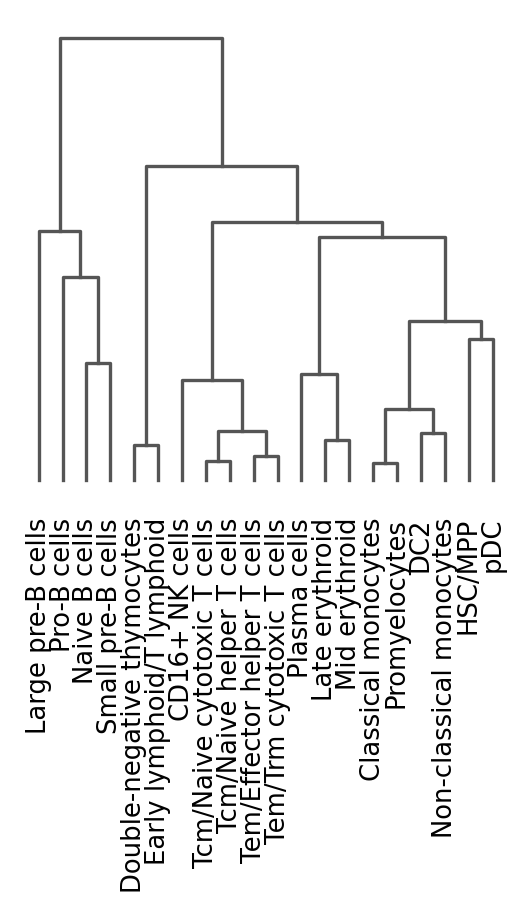

<Axes: >

In [67]:
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")

In [68]:
pd.crosstab(adata.obs["leiden_res_1.25"], 
            adata.obs.celltypist_cell_label_fine).loc["0", :].sort_values(ascending=False)

celltypist_cell_label_fine
Naive B cells                  550
Small pre-B cells              101
Plasma cells                    10
Late erythroid                   4
Pro-B cells                      4
CD16+ NK cells                   0
Tem/Trm cytotoxic T cells        0
Tem/Effector helper T cells      0
Tcm/Naive helper T cells         0
Tcm/Naive cytotoxic T cells      0
Promyelocytes                    0
Non-classical monocytes          0
Classical monocytes              0
Mid erythroid                    0
Large pre-B cells                0
HSC/MPP                          0
Early lymphoid/T lymphoid        0
Double-negative thymocytes       0
DC2                              0
pDC                              0
Name: 0, dtype: int64

In [69]:
pd.crosstab(adata.obs["leiden_res_1.25"], 
            adata.obs.celltypist_cell_label_coarse).loc["0", :].sort_values(ascending=False)

celltypist_cell_label_coarse
B cells                       550
B-cell lineage                105
Plasma cells                   10
Erythroid                       4
DC                              0
Double-negative thymocytes      0
HSC/MPP                         0
Monocytes                       0
Promyelocytes                   0
T cells                         0
pDC                             0
Name: 0, dtype: int64

In [70]:
adata

AnnData object with n_obs × n_vars = 20413 × 17658
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_res_0.50', 'leiden_res_1.00', 'leiden_res_1.25', 'manual_celltype_annotation', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'sample_colors', 'scrublet', 'hvg', 'pca', 'neighb

These can't be written to the output file. But we don't need them anymore so we can remove them.

In [71]:
del adata.uns["dea_leiden_1.25"]
del adata.uns["dea_leiden_1.25_filtered"]

In [ ]:
os.mkdir("../analysis_results")

In [ ]:
adata.write("../analysis_results/07_analysis.h5ad")